PROJECT NAME : EVolutionary Drive

TEAM NAME : Electric Dream Team

TEAM MEMBERS : Arhab Khan, Fuad Khasiyev, Jaya Pabbisetty,
Jayanth Sankar, Pavol Britvch, Qingrui Lou, Rohit Sangem, Xiaojing Su

DATE : 12/06/2023


# **Introduction**

Automotive vehicles have been a source of innovation since their inception in the late 19th century. It is only natural that their power source would eventually adapt and evolve beyond reliance on oil and gas. Electric vehicles and alternative fuel sources have experienced a remarkable surge in popularity over the last decade. According to Google Trends, the term "Electric Vehicle" sparked popularity during the COVID pandemic and peaked in popularity in March 2022. The appeal of electric vehicles extends from individual consumers to governmental authorities. Notably, some states are progressing towards a future ban on traditional combustion engines, accompanied by incentives encouraging consumers to make the transition to electric vehicles. The significance of these impending changes is too substantial to overlook, and our goal is to unveil crucial insights by analyzing datasets and identifying emerging trends.

For our analysis, due to the scope of the project, we will be utilizing numerous data sets from several sources. Details will be provided for each:

The Washington data set is sourced from Data.gov, and shows battery electric vehicle (BEV) and plug-in hybrid electric vehicle (PHEV) that are registered in the state of Washington through the Washington State Department of Licensing (DOL).

Data for Electric Vehicle Charging Stations in the US have been acquired from Kaggle. According to the Kaggle provenance for the data set, the information within is sourced from Energy.gov. The data set includes information regarding United States charging stations, importantly, their latitude and longitude.

Laws and Incentives Dataset is a comprehensive data set on all current laws and regulations surrounding electric vehicles and alternative fuel source vehicles. The data set is sourced from Energy.gov, and maintained by the National Renewable Energy Laboratory (NREL).

Electric Vehicle Sales frequency distribution is a data set from BTS.gov. The data includes the sales of light duty gasoline vehicles, which include HEVs, PHEVs, and electric vehicles (EVs). The data source attrributes it's source to the US Department of Energy. Within the data set, the important information is from sheet 1-19, 3 rows 3, 4, 5 and column B to W.

CO2 equivalent emissions trend by total passenger cars in USA is also sourced from BTS.gov. Each line represents emissions by a specific emission element. From the sheet 4-44, read Row 4 represending, GHG CO2e emissions year wise (CO2 Equivalent in Million Metrics Tons of Green House Gas) by all Light duty vehicles in USA



 **We choose to be  Heavily Graded on Data Analysis part**




**This project is targetted to government bodies, EV manufacturers and environmentalists. And through our analysis, we aim to provide the impact EVs have on the market and the environment and try to answer the following questions :**

**1. What are the laws and incentives categories offered by the US government and their central ideas (i.e., Vehicle Type)?**

To answer this question, the laws and incentives data set will be used. The data set will be imported and reformatted to split each law by it's sub-category. For example, each law has several acronyms under four major categories: Technology, Incentives, Regulations, and Users. The categories are not mutually exclusive, and a law can have attributes/acronyms under multiple categories. After splitting the acronyms into their own columns and attributing dummy variables, we can discover the most common subcategory (acronym) between all laws and incentives within the United States. Finally, a simple bar chart will be used to display our findings.

**2. What is the impact that current U.S. laws have on Electric Vehicles(EVs) EV Charging Infrastructure and adoption? Which of these factors are more likely to influence the Electric Vehicle(EV) movement in various states?**

In this comprehensive analysis, we will combine the cleaned laws and incentives data set with the EV charging station data set. First, we will again split the data into new columns, though this time by law or incentive type. The types are as follows: Laws and Regulations, State Incentives, and Utility / Private Incentives. After discovering the sum of each type by each state, we will be able to create a heat map (choropleth) to vizualize the states with the most and least laws and incentives by type. Overlayed will be clustered markers, showing the geographical location (through coordinates) of every charging station within our data set. The combination of the heat map and markers will allow correlation observations to be made.

**3. Analysing the current dominant players in the United States EV industry.**

The top 5 EV brands in the State of Washington are identified. Their market share in three different time periods are shown and justified using the extensive analysis of the imported data sets.

**4. Forecasting the future dominant players in the United States EV industry using moving average statistical method and the historial market data.**

The primary focus is on the electric vehicle (EV) population in Washington State. The goal is to differentiate between various EV models and evaluate pertinent information about the types and models of EVs that have gained popularity in response to the growing trend. Using manufacturers’ supplementary data, our analysis expanded to assess whether their transition from conventional combustion engine vehicles to EV production positively affects sales and market share. Financial reporting of the top 5 sources in Washington will be examined, followed by a possible expansion to include other states in the evaluations. As the second highest state in terms of EV regulations and incentives, Washington is just behind California. More information about EV registration in the state, with important factors such as make, model and fuel numbers included, highlighting the appropriateness of further examination of the EV landscape and its impact on the automotive market.

**5. How do electric vehicles (EVs) contribute to environmental impact, specifically in terms of carbon emissions?**

Environment has been ipacted the most by EV. Ever since EV sales started booming the CO2 emissions strted decreasing. As per the data about Green house emmisions and sales data found from year 2000.




In [1]:
# Import statements
# importing relevant libraries
import numpy as np
import pandas as pd
import re

%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.graph_objects as go

# **Analyzing the different laws and incentives categories**

### **Initial Cleaning**

The data set used in this analysis is sourced from energy.gov, a government website ran by the US Department of Energy. Specifically, the data set (laws_and_incentives.csv) is maintained by the National Renewable Energy Laboratory (NREL), which contains "laws and incentives related to alternative fuels and vehicles, air quality, vehicle efficiency, and other transportation-related topics" (energy.gov).

Moreover, this information is updated annually at the end of each state's legislative sessions, ensuring that the data used is current and useful. The data is gathered from verified state legislative websites, or by directly calling state offices. It is also important to note that the database does not include all private incentives, as there are too many to reasonably maintain. The database also includes expired, repealed, and archived laws and incentives. Energy.gov provides the following warning: "The Alternative Fuels Data Center recommends that users verify with the appropriate state or federal authority that the specific law or incentive is still applicable before making a purchase or tax-related decision."

To begin, we first read the csv downloaded from energy.gov, which can be found at: https://afdc.energy.gov/data_download/laws_and_incentives_format

In [2]:
# Load the data from the excel file into a data frame
laws_incentives_df = pd.read_csv('laws_and_incentives.csv', index_col = 0)

For the purposes of the following analyses, only state data will be used and all Federal laws and incentives needs to be cleared. Therefore, we will drop any row where the 'State' column has the value of US, which refers to Federal.

In [3]:
# Drop all rows containing Federal laws and incentives
laws_incentives_df = laws_incentives_df.drop(laws_incentives_df[laws_incentives_df['State'] == 'US'].index)

Next, we will remove the columns that are not essential for this analysis. This includes columns such as the enacted date, amended date, the agency the law or incentive is attributed to, the topic, status, etc.

This leaves us with the following columns (information is sourced from the link mentioned previously)
- State: "The two letter abbreviation of the state in which the incentive/law/regulation was enacted and is active. The code 'US' represents federal laws and the code 'DC' is Washington D.C."
- Title: "The brief title assigned to the incentive/law/regulation description."
- Text: "Description of the incentive/law/regulation, including applicable legislative references."
- Sequence Number: "The numerical value assigned to a description to show the order in which it is displayed online within a jurisdiction (state)."
- Type: "The category that the incentive/law/regulation falls under, described below: State Incentives, Laws and Regulations, Utility/Private Incentives"
- Technology Categories: "The fuel, vehicle, or other major technology type the incentive/regulation relates to, given as a code value"
- Incentive Categories: "The type of incentive, given as a code value"
- Regulation Categories: "The type of regulation, given as a code value"
- User Categories: "The type of user subject to the law/regulation or able to claim the incentive, given as a code value"

In [4]:
# Drop non-essential columns
laws_incentives_df = laws_incentives_df.drop(columns = ['Enacted Date','Amended Date','Recent?','Agency','Significant Update Date','Expired Date','Archived Date','Repealed Date','Topic','References','Status','Status Date'])

### **Splitting the columns into respective definitions**

The next step for processing the data set is to split the code values into their own respective columns, and then assign dummy variables. To begin, we will create lists of all the categories values. The categories as stated previously, include Technology, Incentives, Regulations, and Users, each with several code values. The following are the acronyms and their meanings:

#### Acronym Key :
**Technology Categories** :
- AFTMKTCONV : After Market Conversions
- AUTONOMOUS : Connected and Autonomous Vehicles
- BIOD : Biodiesel
- EFFEC : Fuel Economy / Efficiency
- ELEC : All Electric Vehicles
- ETH : Ethanol / Flexible Fuel Vehicles
- HEV : Hybrid Electric Vehicles
- HY : Hydrogen / Fuel Cell Electric Vehicles
- IR : Idle Reduction
- LPG : Liquefied Petroleum Gas / Propane Vehicles
- NEVS : Neighborhood Electric Vehicles
- NG : Natural Gas Natural / Gas Vehicles
- OTHER : Other Technologies
- PHEV : Plug In Hybrid Electric Vehicles
- RD : Renewable Diesel

**Incentive Categories** :
- EXEM : Exemptions
- GNT : Grands
- LOANS : Loans and Leases
- OTHER : Other Incentives
- RBATE : Rebates
- TAX : Tax Incentives
- TOU : Time-of-Use Rate

**Regulation Categories** :
- AIRQEMISSIONS : Air Quality/Emissions
- BUILD : Building Codes
- CCEINIT : Climate Change/Energy Initiatives
- DREST : Driving/Idling
- EVFEE : Electric Vehicle EV Registration Fee
- FUEL : Fuel Taxes
- OTHER : Other Regulations
- REGIS : Registration/Licensing
- REQ : Acquisition/Fuel Use
- RFS : Renewable Fuel Standard/Mandate
- RTC : Right-to-Charge
- STD : Fuel Production/Quality
- UTILITY : Utility Definition

**User Categories** :
- AFP : Alternative Fuel Producer
- FLEET : Commercial
- GOV : Government Entity
- IND : Personal Vehicle Owner or Driver
- MAN : Alternative Fuel Vehicle AFV Manufacturer or Retrofitter
- MUD : Multi-Unit Dwelling
- OTHER : Other Users
- PURCH : Alternative Fuel Purchaser
- STATION : Alternative Fuel Infrastructure Operator
- TRANS : Transit
- TRIBAL : Tribal Government


In [5]:
# Define new columns
tech_cat_re = ['AFTMKTCONV','AUTONOMOUS','BIOD','EFFEC','ELEC','ETH','HEV','HY','IR','LPG','NEVS','NG','OTHER','PHEV','RD']
incent_cat_re = ['EXEM','GNT','LOANS','OTHER','RBATE','TAX','TOU']
reg_cat_re = ['AIRQEMISSIONS','BUILD','CCEINIT','DREST','EVFEE','FUEL','OTHER','REGIS','REQ','RFS','RTC','STD','UTILITY']
user_cat_re = ['AFP','FLEET','GOV','IND','MAN','MUD','OTHER','PURCH','STATION','TRANS','TRIBAL']

Creating a function will allow us to process all of the previous information into our end result - more columns. The function takes a data frame, a target column (Technology, Incentives, Regulations, or Users), a list of new columns, and a prefix.

Function Process:
1. For each value in the list of acronyms, a new column will be made. The new column will be titles the category value (acronym) with the category prefix.
2. Each value will then be assigned a dummy variable, either 0 or 1.
3. The original category column will be dropped once all category values are transitioned into columns
4. Return the updated data frame

The prefix is an important attritube, as for example, all four categories have a similar value: Other. Without the prefix, we would not be able to easily tell which colomn the 'Other' value was initially part of. This also applies to all of the other columns, as it simply makes it easier to read.

The fuction will be applied four times, once to each category.

In [6]:
# Create function for checking matches
# Requires a dataframe, a target column, a list, and a prefix
def check_cat(df, column, pattern_list, prefix):
    # iterate through new colmuns
    for pattern in pattern_list:
        # extract the new column if present
        df[prefix+pattern] = df[column].str.extract('(?P<'+prefix+pattern+'>'+pattern+')', expand = True)
        # convert new column to dumbies
        df[prefix+pattern] = pd.get_dummies(df[prefix+pattern])
    # Drop original column
    df.drop(column, axis=1, inplace=True)
    return df

# Calling the function for each list created
check_cat(laws_incentives_df,'Technology Categories',tech_cat_re, 'tech_')
check_cat(laws_incentives_df,'Incentive Categories',incent_cat_re, 'incent_')
check_cat(laws_incentives_df,'Regulation Categories',reg_cat_re, 'reg_')
check_cat(laws_incentives_df,'User Categories',user_cat_re, 'user_')

,State,Title,Text,Sequence Number,Type,tech_AFTMKTCONV,tech_AUTONOMOUS,tech_BIOD,tech_EFFEC,tech_ELEC,...,user_FLEET,user_GOV,user_IND,user_MAN,user_MUD,user_OTHER,user_PURCH,user_STATION,user_TRANS,user_TRIBAL
Law Id,,,,,,,,,,,,,,,,,,,,,
202,CO,Low Emission Vehicle (LEV) Sales Tax Exemption,"Vehicles, vehicle power sources, or parts used...",30.0,State Incentives,1,0,0,0,0,...,1,0,1,1,0,0,0,0,0,0
4153,AL,Alternative Fuel Taxes,The state road tax for vehicles that operate o...,24.0,Laws and Regulations,0,0,0,0,0,...,1,1,1,0,0,0,0,0,0,0
4178,AZ,Zero Emission Vehicle Emissions Test Exemption,Electric vehicles registered in Arizona are no...,42.0,State Incentives,0,0,0,0,1,...,1,1,1,0,0,0,0,0,0,0
4179,AZ,Reduced Alternative Fuel Vehicle (AFV) License...,The vehicle license tax for an AFV registered ...,30.0,State Incentives,0,0,0,0,1,...,1,1,1,0,0,0,0,0,0,0
4216,CA,Air Quality Improvement Program Funding - Vent...,The Ventura County Air Pollution Control Distr...,106.0,State Incentives,0,0,0,0,0,...,1,1,0,0,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13365,WA,Fleet Electrification Incentives – Seattle Cit...,Seattle City Light offers advisory services to...,30.0,Utility / Private Incentives,0,0,0,0,1,...,1,1,0,0,0,0,0,0,1,0
13367,HI,Electric Vehicle (EV) Road Usage Charge Develo...,The Hawaii Department of Transportation must d...,42.0,Laws and Regulations,0,0,0,0,1,...,0,1,0,0,0,0,0,0,0,0
13368,HI,Transportation Emission Reduction Goal and Ele...,Hawaii established state goals to reduce green...,47.0,Laws and Regulations,0,0,0,0,1,...,0,1,0,0,0,0,0,0,0,0


In [7]:
# Sum dummy variables by column
laws_categories=laws_incentives_df.iloc[:,5:].sum().sort_values(ascending=False).head(15)

laws_categories

tech_ELEC       1239
tech_HEV        1092
tech_PHEV       1082
user_GOV         751
user_FLEET       649
user_IND         643
user_STATION     621
tech_NG          379
user_OTHER       375
tech_HY          366
tech_BIOD        294
reg_OTHER        290
incent_RBATE     277
tech_LPG         275
tech_ETH         273
dtype: int64

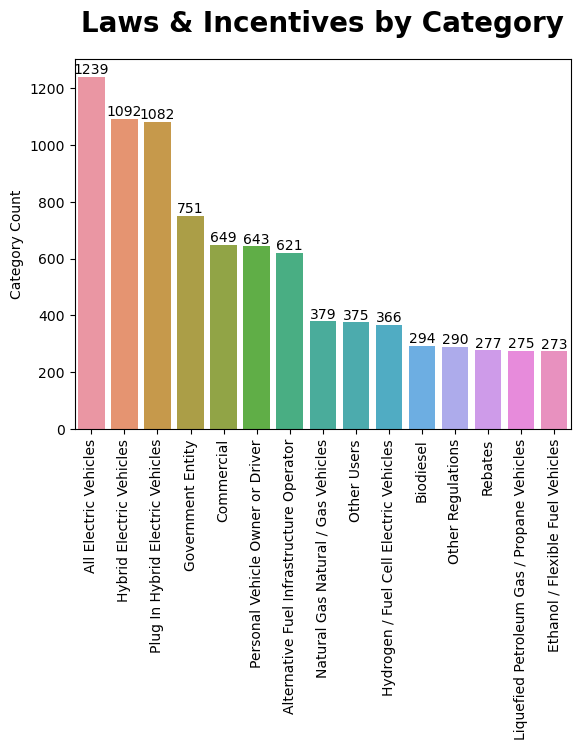

In [8]:
import seaborn as sns

# Rename the top 15 categories
new_names = {'tech_ELEC': 'All Electric Vehicles',
             'tech_HEV': 'Hybrid Electric Vehicles',
             'tech_PHEV': 'Plug In Hybrid Electric Vehicles',
             'user_GOV': 'Government Entity',
             'user_FLEET': 'Commercial',
             'user_IND': 'Personal Vehicle Owner or Driver',
             'user_STATION': 'Alternative Fuel Infrastructure Operator',
             'tech_NG': 'Natural Gas Natural / Gas Vehicles',
             'user_OTHER': 'Other Users',
             'tech_HY': 'Hydrogen / Fuel Cell Electric Vehicles',
             'tech_BIOD': 'Biodiesel',
             'reg_OTHER': 'Other Regulations',
             'incent_RBATE': 'Rebates',
             'tech_LPG': 'Liquefied Petroleum Gas / Propane Vehicles',
             'tech_ETH': 'Ethanol / Flexible Fuel Vehicles',}

# Rename
laws_categories = laws_categories.rename(index=new_names)

# Plot a bar chart
axis = sns.barplot(x=laws_categories.index, y=laws_categories)#, palette=['green'])
axis.set_title('Laws & Incentives by Category', fontdict={'fontsize': 20, 'fontweight': 700, 'color': 'black'}, pad=20)
plt.ylabel('Category Count')
plt.xticks(rotation='vertical')

for p in axis.patches:
    height = p.get_height()
    axis.annotate(f'{height:.0f}',xy=(p.get_x() + p.get_width() / 2, height), ha='center', va='bottom')

#### **Analysis:**

After cleaning and assigning dummy variables from within the laws and incentives data frame, we can observe the top ten following components of laws and incentives surrounding EVs in the United States.

- All Electric Vehicles (tech_ELEC, 1239)
- Hybrid Electric Vehicles (tech_HEV, 1092)
- Plug In Hybrid Electric Vehicles (tech_PHEV, 1082)
- Government Entity (user_GOV, 751)
- Commercial (user_FLEET, 649)
- Personal Vehicle Owner or Driver (user_IND, 643)
- Alternative Fuel Infrastructure Operator (user_STATION, 621)
- Natural Gas Natural / Gas Vehicles (tech_NG, 379)
- Other Users (user_OTHER, 375)
- Hydrogen / Fuel Cell Electric Vehicles(tech_HY, 366)

As expected, the top three include all electric vehicles, hybrid electric vehicles, and plug-in hybrid electric vehicles. The common denominator between these three categories are the electricity-basis. According to energy.gov, electricity is considered an alternative fuel under the Energy Policy Act of 1992, which can be produced from the use of natural gas, coal, nuclear energy, wind, hydropower, and solar.

On the other hand, the bottom of our list includes Hydrogen / fuel cell vehicles. According to energy.gov, the fuel cells use the chemical energy of hydrogen to "cleanly and efficiently produce electricity," where the only byproducts are electricty, water and heat. While this is an extremely advantageous technology, it simply is not as accessible nor popular as traditional electric vehicles. Most of the accessibility issue comes from the scarcity of elemental hydrogen, where the cheapest way to produce the hydrogen produces an excess of carbon dioxide (First Mode).

The correlation between the laws and incentives of electric vehicles and other alternative fuel sources can be attributed mainly to it's accessability, as well as it's infrastructure which will be covered in the following map. The wide availability of charging infrastructure, and the diverse sources of power productions, as well as the maturity of the technology allow traditional electric vehicles to dominate the market. With a higher suppler, especially on a product as regulated as vehicles (i.e., road safety), we can infer that the amount of laws and incentives are directly correlated to the amount of alternative fuel source vehicles.

While Hydrogen fuel cell vehicles have incredible potential, as stated, the limited infrastructure and production challenges have prevented the vehicles from being as popular as their EV counterparts. Therefore, using the same inference, we can conclude that as the reason for their lack of laws and incentives.

Equally, we can conclude that as the technologies becomes more mature and accepted with personal and commercial populations, we can expect the state laws and incentives to increase accordingly.

# **Analyzing the charging stations and laws and incentives offered by the government**

### **Charging Stations**

The EV_stations.csv file is used as the data sourse for locations of charging stations across the US.

In [9]:
charging_station_df = pd.read_csv('EV_stations.csv')

# Delete the column
charging_station_df.drop(['EV Level1 EVSE Num', 'EV On-Site Renewable Source','EV DC Fast Count','Facility Type'], axis=1, inplace=True)

# Drop Locations not in the US
charging_station_df

,Country,State,ZIP,Latitude,Longitude,EV Level2 EVSE Num,ID,Open Date,Access Code
0,US,AK,99801,58.354895,-134.495377,2.0,72524,2/1/15,public
1,US,AK,99801,58.298366,-134.404006,2.0,81601,2/1/17,public
2,US,AK,99801,58.363727,-134.575550,1.0,85589,8/1/15,public
3,US,AK,99518,61.169369,-149.911144,2.0,88609,11/30/17,public
4,US,AK,99669,60.494658,-151.045242,3.0,112694,11/27/17,public
...,...,...,...,...,...,...,...,...,...
53888,US,WY,82930,41.254635,-110.969556,NaN,214279,4/19/22,public
53889,US,WY,82414,44.534583,-109.027233,1.0,220411,6/1/22,public
53890,US,WY,82520,42.834423,-108.745422,2.0,220959,6/8/22,public
53891,US,WY,83001,43.477678,-110.764935,NaN,225937,8/20/22,public


Making sure the locations analysed are inside the US.

In [10]:
# Removing the outliers
charging_station_df=charging_station_df[(charging_station_df["Longitude"] <=-65) & (charging_station_df["Longitude"] >=-170) ]
charging_station_df

,Country,State,ZIP,Latitude,Longitude,EV Level2 EVSE Num,ID,Open Date,Access Code
0,US,AK,99801,58.354895,-134.495377,2.0,72524,2/1/15,public
1,US,AK,99801,58.298366,-134.404006,2.0,81601,2/1/17,public
2,US,AK,99801,58.363727,-134.575550,1.0,85589,8/1/15,public
3,US,AK,99518,61.169369,-149.911144,2.0,88609,11/30/17,public
4,US,AK,99669,60.494658,-151.045242,3.0,112694,11/27/17,public
...,...,...,...,...,...,...,...,...,...
53888,US,WY,82930,41.254635,-110.969556,NaN,214279,4/19/22,public
53889,US,WY,82414,44.534583,-109.027233,1.0,220411,6/1/22,public
53890,US,WY,82520,42.834423,-108.745422,2.0,220959,6/8/22,public
53891,US,WY,83001,43.477678,-110.764935,NaN,225937,8/20/22,public


### **Building the Choropleth and Cluster Map**

For the purpose of the following vizualization, we will only require counts of the type of laws and incentives specified per each state. The three categories include:
1. Laws and Regulations
2. State incentives
3. Utility / Private Incentives

As well, we will include a column for the total laws and incentives per state, which is the sum of the previous three categories. Also, a column will be added to include the amount of charging stations per each state, pulled from our charging station data frame.

To have easier access to our state column, we will also reset the index.

In [11]:
# Get the count of each type of law or incentive by state
type_by_state_df = laws_incentives_df.groupby('State')['Type'].value_counts().unstack(fill_value=0)

# Get the count of each states laws and incentives
type_by_state_df['Total'] = laws_incentives_df.groupby('State').size()

# Get the count of charging stations by state
type_by_state_df['Stations'] = charging_station_df.groupby('State').size()

# Create percent total of laws and incentives
type_by_state_df['Percent Total Laws & Incentives'] = type_by_state_df['Total'].apply(lambda x: (x / type_by_state_df['Total'].sum()) * 100)

# Create percent total of charging stations
type_by_state_df['Percent Total Stations'] = type_by_state_df['Stations'].apply(lambda x: (x / type_by_state_df['Stations'].sum()) * 100)

type_by_state_df.reset_index(inplace=True)

To create our visualization, we will first have to import the Python library Folium, a library which will allow us to create powerful Leaflet maps.

In [12]:
import folium
from folium.plugins import MarkerCluster
from IPython.display import IFrame

Next, we will intialize the creation of our Folium map by assigning folium.Map to our variable ev_charging_station_choropleth. The parameters within the function include location and zoom.

The location parameter specifies the center of the map, and in this case, we will set it to the mean of our latitude and longitude column in our charging station data frame. This will center the map at the average geographical coordinates of all the charging stations we have, specifically the United States.

The zoom_start parameter sets the initial zoom level of the map. In this case, it is set to 4.

In [13]:
# Create Folium Map
ev_charging_station_choropleth = folium.Map(location=[charging_station_df['Latitude'].mean(), charging_station_df['Longitude'].mean()], zoom_start=4)

For the Folium map to work, it requires geographical data in the form of a GeoJSON file. GeoJSON is a format for encoding a variety of geographic data structures, and in this case, the file 'us-states.json' contains the boundary information for each US state, which will be used to draw the state boundaries on a map. In our case, it will be used to define the bounderies for a choropleth.

The source of the GeoJSON is from github, and can be found following this link: https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/us-states.json

In [14]:
# Define the geographic json file
state_geo = 'us-states.json'

The choropleth we are creating will use each of the previously created columns as layers. Therefore, we must define a function to create the multiple Folium choropleth layers, calling it choropleth_layer. The parameters are as follows:

1. name: The name of the choropleth layer. This will also name the correlated legend.
2. column: The column in the simplified data frame we recently created. The data from this column will be used to dictate the colors on the choropleth. The high the value, the deeper the color.
3. color: The color scale used in the layer. I.e., YlGn is equal to Yellow -> Green

Within the function, there are more parameters for Folium's folium.Choropleth. They include the following:
- geo_data: The GeoJSON data representing geographic boundaries
- name: Sets the name of the choropleth layer, and defined as a parameter (name)
- data: The data frame used to create the visualization
- columns: The list of column names from our data frame. This will always include the State, and then be variable depending on our functions parameters.
- key_on: The key or ID in the GeoJSON file that matches the State column in the data frame
- fill_color: The color scale defined as a parameter
- fill_opacity: The opacity of the color
- line_opacity: The opacity of the boundary lines
- legend_name: Sets the name of the layers legend, defined as a parameter (name)

Lastly, folium.Choropleth just defined is then added to our previously created Folium map, ev_charging_station_choropleth.

Creating a secondary data frame, of the same information above, will be beneficial soley for creating a larger contrast between the shades in the following choropleth. Because California has such a heavy weight in both charging stations and laws and incentives, we must convert the columns used in the choropleth to logarithmic. This will decrease the distance between the largest and smallest numbers, thus increasing contrast on the map. This will prove beneficial for visual analysis.

In [15]:
# Create logarithmic version of the table
type_by_state_log = type_by_state_df[['State','Laws and Regulations','State Incentives','Utility / Private Incentives','Total','Stations']].copy()

# Convert each value, except state, to log10
type_by_state_log.iloc[:, 1:] = type_by_state_log.iloc[:, 1:].apply(lambda arr: np.log10(arr), axis=0)

In [16]:
# Define Choropleth layer function
def choropleth_layer(name, column, color = 'YlGn'):
    folium.Choropleth(
    geo_data=state_geo,
    name=name,
    data=type_by_state_log,
    columns=['State', column],
    key_on='feature.id',
    fill_color=color,
    fill_opacity=1,
    line_opacity=.1,
    legend_name=name,
    ).add_to(ev_charging_station_choropleth)

Now that the function has been defined, we can run it five times, for each column in our data frame. This includes:
- Total Laws and Incentives by State
- Laws and Regulations by State
- State Incentives by State
- Utility / Private Incentives by State
- Charging Stations by State

In [17]:
# Add choropleth layer 'Total'
choropleth_layer('Total Laws and Incentives by State','Total')

# Add choropleth layer 'Laws and Regulations'
choropleth_layer('Laws and Regulations by State','Laws and Regulations')

# Add choropleth layer 'State Incentives'
choropleth_layer('State Incentives by State','State Incentives')

# Add choropleth layer 'Utility and Private'
choropleth_layer('Utility / Private Incentives by State','Utility / Private Incentives')

# Add choropleth layer 'Charging Stations'
choropleth_layer('Charging Stations by State','Stations','OrRd')

Folium also allows us to apply marker clusters using the coordinates from our Charging Station data frame. To do this, we will use MarkerCluster(), which is used to group multiple markers that are close to each other on the map. When markers are close, they are grouped into a cluster to avoid clutter on the map.

The next part, .add_to(ev_charging_station_choropleth), adds the MarkerCluster to the existing Folium map. Using a Marker Cluster is beneficial when there are a large number of charging stations in close proximity, especially since our data includes 15,000 charging stations for California alone. The clusters help to improve the map's readability by grouping nearby charging stations into clusters, and as the user zooms in, the clusters break apart to reveal individual markers.

In [18]:
# Create clusters
marker_cluster = MarkerCluster().add_to(ev_charging_station_choropleth)

Now that the marker cluster has been established, we can now add our coordinates. A for loop will be used to iterate through our charging station data frame, and add individual markers for each charging station (coordinate pair) to the marker cluster. This is done through folium.Marker, which takes the location as a coordinate.

In [19]:
# Add coordinates to cluster
for index, row in charging_station_df.iterrows():
    folium.Marker(location=[row['Latitude'], row['Longitude']]).add_to(marker_cluster)

Now that the marker cluster has been added to the map, and coordinates / markers added to the marker cluster, we can add graphical user interface (GUI) which will allow the map's user to select which layers are visible. This is done simply by using and adding folium.LayerControl.

In [20]:
# Add layer control with a custom name
folium.LayerControl().add_to(ev_charging_station_choropleth)

Lastly, we will save the map as a dynamic HTML file.

In [21]:
# Save the map to an HTML file
html_file = 'dynamic_EV_map.html'
ev_charging_station_choropleth.save('dynamic_EV_map.html')

# Display the map (compatible with Jupyter HTML export)
IFrame(html_file, width=700, height=500)

# Show the map
ev_charging_station_choropleth

In [22]:
type_by_state_df[['Percent Total Laws & Incentives','Percent Total Stations']].corr()

Type,Percent Total Laws & Incentives,Percent Total Stations
Type,,
Percent Total Laws & Incentives,1.000000,0.891342
Percent Total Stations,0.891342,1.000000


#### **Choropleth and Cluster Map Analysis:**

As we observed earlier, the primary type of law or incentive across the United States revolves around Electric Vehicles, or electricity as the source of alternative fuel. The purpose of importing and cleaning the data for the charging station coordinates is to visually discover any correlations or trends between the amount of legislation/incentives and station locations.

The numerous layers of the choropleth will help build this story. The green colored layers are for the data relating to laws and incentives, whereas the orange and red layer is for charging stations. The map’s layers can be toggled, allowing us to see a heat map across the states for the total laws and incentives, or the sub-categories such as utility / private incentives by state or state incentives by state. For direct comparisons without toggling, clustered markers are also provided to give a sense of the amount of charging stations in relation to the laws and incentives.

Using the ‘total laws and incentives by state’ layer, it is immediately apparent that California has the highest amount of legislation and incentives for alternative fuel sources. Compared to the other states, it's the darkest, boldest green. Other notable states include Washington, Oregon, Colorado, Minnesota, New York, Massachusetts, Connecticut, New Jersey, Maryland, and Virginia. Switching our view of the heat map to charging stations, we can find some more states starting to draw attention. The darker red states, which have more charging stations, include California, Texas, Florida, Massachusetts, and New York.

From this, we can visually observe that California dominates both spectrums, but other states with large populations and major cities also have large EV charging station populations. While the choropleth does not show numerical information, it will be an important factor in our observations and analysis. The following table will show some of the highlights:

| State | Percent (%) Total Laws & Incentives | Percent (%) Total Stations |
| :- | :-: | :-: |
| California (CA) | 9.72% | 28.57% |
| New York (NY) | 3.44% | 6.13% |
| Florida (FL) | 1.91% | 5.42%
| Texas (TX) | 2.24% | 4.65% |

Another important statistic to consider is the correlation between the percentage of total laws & incentives vs. the percentage of total stations, which is 0.891. This implies a strong positive relationship between states’ laws and incentives and the amount of charging stations within that state.
What’s interesting to notice are the outliers. It’s not surprising to see California (15,396 stations) and New York (3,304 stations) at the top of the leaderboard, as the states are generally extremely progressive. Supporting the above figure, according to the NY Times, factors influencing the boom in electric vehicle ownership in NYC are due to a rise in varied models, more public charging stations, and significant government incentives.
On the other hand, more conservative states such as Florida (2,919 stations) and Texas (2,504 stations) are also at the top of the leaderboard. We can infer from this that the amount of relation between laws and incentives and charging stations, or the amount of charging stations, is not influenced by the state's political spectrum. Instead, they are independent variables, and should not be used to predict sales growth of electric vehicles. According to Clean Technica, higher EV sales volume in Florida and Texas “is in part tied to the higher population”,  more EV models are available, and adoption across the US is more widespread. These shifts have not only led Texas and Florida to have high amounts of charging stations, but the states are second and third in cumulative EV sales, “despite leadership that has been antagonistic toward EVs and a more conservative-leaning population” (Clean Technica).



# **Analyzing the top EV manufacturers**

Loading the Washington State EV population dataset

In [23]:
df_evs = pd.read_csv('Electric_Vehicle_Population_Data.csv', header = 0)
df_evs

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,KM8K33AGXL,King,Seattle,WA,98103.0,2020,HYUNDAI,KONA,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,258,0,43.0,249675142,POINT (-122.34301 47.659185),CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),5.303300e+10
1,1C4RJYB61N,King,Bothell,WA,98011.0,2022,JEEP,GRAND CHEROKEE,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,25,0,1.0,233928502,POINT (-122.20578 47.762405),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),5.303302e+10
2,1C4RJYD61P,Yakima,Yakima,WA,98908.0,2023,JEEP,GRAND CHEROKEE,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,25,0,14.0,229675939,POINT (-120.6027202 46.5965625),PACIFICORP,5.307700e+10
3,5YJ3E1EA7J,King,Kirkland,WA,98034.0,2018,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,215,0,45.0,104714466,POINT (-122.209285 47.71124),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),5.303302e+10
4,WBY7Z8C5XJ,Thurston,Olympia,WA,98501.0,2018,BMW,I3,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,97,0,22.0,185498386,POINT (-122.89692 47.043535),PUGET SOUND ENERGY INC,5.306701e+10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150477,WBY43AW05P,Grays Harbor,Montesano,WA,98563.0,2023,BMW,I4,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0,0,19.0,251204075,POINT (-123.60535 46.982215),BONNEVILLE POWER ADMINISTRATION||PUD NO 1 OF G...,5.302700e+10
150478,5YJ3E1EB7P,King,Seattle,WA,98104.0,2023,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0,0,43.0,241344414,POINT (-122.329075 47.6018),CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),5.303301e+10
150479,5YJYGDEEXM,King,Seattle,WA,98109.0,2021,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0,0,43.0,180705626,POINT (-122.34848 47.632405),CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),5.303301e+10
150480,5UXTA6C08P,Snohomish,Mountlake Terrace,WA,98043.0,2023,BMW,X5,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,30,0,1.0,240473950,POINT (-122.30842 47.78416),PUGET SOUND ENERGY INC,5.306105e+10


### **EDA Analysis**

In [24]:
df_evs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150482 entries, 0 to 150481
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         150482 non-null  object 
 1   County                                             150479 non-null  object 
 2   City                                               150479 non-null  object 
 3   State                                              150482 non-null  object 
 4   Postal Code                                        150479 non-null  float64
 5   Model Year                                         150482 non-null  int64  
 6   Make                                               150482 non-null  object 
 7   Model                                              150482 non-null  object 
 8   Electric Vehicle Type                              150482 non-null  object

The data has 16 columns and 150137 rows, currently, with no significant amounts of missing values in any columns. However, Base MSRP and Electric Range contain a large amount of missing data that is filled with 0 instead of null valus. Hence, as a part of the data, cleaning these missing values will be handled.

To start the cleaning process of the data, we will get rid of the unnecessary wording, shorten some of the column names, assign a unique index column from the present data. Additionally, we will separate the Location values into Latitute and Longitude for easily visualizing the data in the Analysis section of the Project.

In [25]:
## Removing the word POINT
df_evs['Vehicle Location'] = df_evs['Vehicle Location'].str.replace('POINT','')

# Extracting Latitude and Longitude
df_evs[['Latitude','Longitude']] = df_evs['Vehicle Location'].str.extract('[(](?P<Latitude>.*)\s(?P<Longitude>.*)[)]', expand = True).astype(float)

# Dropping original location column
df_evs.drop('Vehicle Location', axis = 1, inplace = True )

df_evs.head()

## Clean Alternative Fuel Vehicle Eligibility = CAFV Eligibility
df_evs = df_evs.rename(columns = {'Clean Alternative Fuel Vehicle (CAFV) Eligibility':'CAFV Eligibility'})

The string values in the CAFV Eligibility column are too wordy and memory-intensive, we will replace them by shorter strings to save up storage. The same will be executed for the vlaues in the Electric Vehicle type column

In [26]:
## Replacing the observations in CAFV Eligibility with shorter versions to save memory
new = {
    "Clean Alternative Fuel Vehicle Eligible": "Eligible",
    "Eligibility unknown as battery range has not been researched": "Unknown",
    "Not eligible due to low battery range": "Not Eligible"
}

df_evs['CAFV Eligibility'] = df_evs['CAFV Eligibility'].replace(new)

In [27]:
## Replacing Battery Electric Vehicle in Type with BEV and Plug-in Hybrids with PHEV
new1 = {'Battery Electric Vehicle (BEV)' : 'BEV',
           'Plug-in Hybrid Electric Vehicle (PHEV)' : 'PHEV'}
df_evs['Electric Vehicle Type'] = df_evs['Electric Vehicle Type'].replace(new1)

As this data will be used to analyze the EV population of Washington state, we will check whether all the observations in the dataset are for Washington. If not, all the other state observations will be dropped for the further analysis.

In [28]:
df_evs['State'].value_counts().head(15)

WA    150141
CA        92
VA        35
MD        33
TX        20
NC        13
IL        12
AZ        11
CO        11
FL         9
NJ         9
HI         8
OR         8
NY         7
CT         7
Name: State, dtype: int64

As we can see, the dataset contains a number of observations for the other states. The quantity for the other states is not sufficient enough to include them in the analysis. Hence these observatios will be dropped.

In [29]:
## Only keeping the WA data
df_evs = df_evs.loc[df_evs['State'] == 'WA']
df_evs['State'].value_counts()

WA    150141
Name: State, dtype: int64

### **Handling Missing Data**

In [30]:
## Replacing MSRP values of 0 with NaN
df_evs.loc[:,'Base MSRP'].replace(0, np.nan, inplace = True)
df_evs['Base MSRP'].isna().sum()

146696

Since the majority of the values for the Base MSRP data is missing, the column will be dropped alltogether.

In [31]:
df_evs.drop('Base MSRP', axis = 1, inplace = True )

Now, we look at the data for the Electric Ranges of the Vehicles.

In [32]:
grouped = df_evs.groupby(by='CAFV Eligibility')

In [33]:
for category, group in grouped:
    print(category, len(group))

Eligible 62793
Not Eligible 17767
Unknown 69581


For more than 46% of the observations, their Electric Range is unknown as their CAFV Elibility was not researched. Normally, it would be better to drop these observations; however, we will use the data of their location and other values to later conduct an analysis. Hence, we will scrape the data from the web, containing the Electric Ranges for the majority of the vehicles in our data frame.

### **Web Scraping**

We first must read the desired webpage, ev-database.org. The webpage provides data on the kilometer ranges of many EVs. Some additions must be made:

- Parse the make and model to add individual make and model columns
- Convert the range to miles

In [34]:
## Scraping the data from the Web
df_er = pd.read_html('https://ev-database.org/cheatsheet/range-electric-car', header=0)[0]

## Renaming the columns with convenient names
df_er = df_er.rename(columns = {'Average':'Make and Model',
                                 '361 km' : 'Electric Range'})

## Splitting the make and model column
df_er['Make'] = df_er['Make and Model'].str.split(n=1).str[0]
df_er['Model'] = df_er['Make and Model'].str.split(n=1).str[1]

## Making sure they are identical with the values in the original dataframe
df_er['Make'] = df_er['Make'].str.upper()
df_er['Model'] = df_er['Model'].str.upper()
df_er.drop('Make and Model', axis = 1, inplace = True )

## Converting Range values from kms to miles
df_er['Electric Range'] = (df_er['Electric Range'] * 0.621371).round(0)

In [35]:
## Hard copying the original scraped data frame
df_er_copy = df_er.copy()

Now, as we observed in the second data frame, most of the Model names are shortened, we will use only the first two words describing the model of the cars in the second dataset to fill more values in the first one. As mentioned earlier, these values will be the best assumption for their Electric Range and will help us to get more accurate results in the analysis of the data.

In [36]:
df_er_copy['Model'] = df_er_copy['Model'].str.split().str[:2].str.join(' ')
df_er_copy.head()

,Electric Range,Make,Model
0,426.0,LUCID,AIR DREAM
1,413.0,LUCID,AIR GRAND
2,413.0,LUCID,AIR DREAM
3,395.0,MERCEDES,EQS 450+
4,379.0,MERCEDES,EQS 450


In [37]:
merged_evs = pd.merge(df_evs, df_er_copy, left_on=['Make', 'Model'], right_on=['Make', 'Model'], how='left', suffixes = ('', '_new'))
merged_evs.drop_duplicates(subset = 'DOL Vehicle ID', inplace = True)

Now that we dropped the duplicates that occured after the merge, using the unique DOL Vehicle ID column, the values for the Electric Range will be replaced with the new ones if their original value was zero.

In [38]:
def replacing(df = merged_evs):
    if df['Electric Range'] == 0 and not np.isnan(df['Electric Range_new']):
        return df['Electric Range_new']
    else:
        return df['Electric Range']

## Applying the formula to the merged data frame
merged_evs['Electric Range'] = merged_evs.apply(replacing, axis=1)
merged_evs.drop('Electric Range_new', axis = 1, inplace = True)

Using this strategy, now, we will use the first two words of the Models to replace the 0s in the Electric Range Values.

In [39]:
df_er_copy1 = df_er.copy()
df_er_copy1['Model'] = df_er_copy1['Model'].str.split().str[0]
df_er_copy1.head()

,Electric Range,Make,Model
0,426.0,LUCID,AIR
1,413.0,LUCID,AIR
2,413.0,LUCID,AIR
3,395.0,MERCEDES,EQS
4,379.0,MERCEDES,EQS


In [40]:
merged_evs1 = pd.merge(merged_evs, df_er_copy1, left_on=['Make', 'Model'], right_on=['Make', 'Model'], how='left', suffixes = ('', '_new'))

## Dropping the Duplicates once again
merged_evs1.drop_duplicates(subset = 'DOL Vehicle ID', inplace = True)

## Applying the replacing formula
merged_evs1['Electric Range'] = merged_evs1.apply(replacing, axis=1)

## Dropping the 2nd Electric Range column
merged_evs1.drop('Electric Range_new', axis = 1, inplace = True)

## Replacing the remaining 0s at Electric Range with np.nan
merged_evs1['Electric Range'].replace(0, np.nan, inplace = True)

## Counting the total number of missing values after the data replacement
merged_evs1['Electric Range'].isna().sum()

8733

In [41]:
merged_evs1

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,CAFV Eligibility,Electric Range,Legislative District,DOL Vehicle ID,Electric Utility,2020 Census Tract,Latitude,Longitude
0,KM8K33AGXL,King,Seattle,WA,98103.0,2020,HYUNDAI,KONA,BEV,Eligible,258.0,43.0,249675142,CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),5.303300e+10,-122.343010,47.659185
4,1C4RJYB61N,King,Bothell,WA,98011.0,2022,JEEP,GRAND CHEROKEE,PHEV,Not Eligible,25.0,1.0,233928502,PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),5.303302e+10,-122.205780,47.762405
5,1C4RJYD61P,Yakima,Yakima,WA,98908.0,2023,JEEP,GRAND CHEROKEE,PHEV,Not Eligible,25.0,14.0,229675939,PACIFICORP,5.307700e+10,-120.602720,46.596562
6,5YJ3E1EA7J,King,Kirkland,WA,98034.0,2018,TESLA,MODEL 3,BEV,Eligible,215.0,45.0,104714466,PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),5.303302e+10,-122.209285,47.711240
7,WBY7Z8C5XJ,Thurston,Olympia,WA,98501.0,2018,BMW,I3,PHEV,Eligible,97.0,22.0,185498386,PUGET SOUND ENERGY INC,5.306701e+10,-122.896920,47.043535
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199169,WBY43AW05P,Grays Harbor,Montesano,WA,98563.0,2023,BMW,I4,BEV,Unknown,320.0,19.0,251204075,BONNEVILLE POWER ADMINISTRATION||PUD NO 1 OF G...,5.302700e+10,-123.605350,46.982215
199172,5YJ3E1EB7P,King,Seattle,WA,98104.0,2023,TESLA,MODEL 3,BEV,Unknown,314.0,43.0,241344414,CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),5.303301e+10,-122.329075,47.601800
199173,5YJYGDEEXM,King,Seattle,WA,98109.0,2021,TESLA,MODEL Y,BEV,Unknown,270.0,43.0,180705626,CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),5.303301e+10,-122.348480,47.632405
199174,5UXTA6C08P,Snohomish,Mountlake Terrace,WA,98043.0,2023,BMW,X5,PHEV,Eligible,30.0,1.0,240473950,PUGET SOUND ENERGY INC,5.306105e+10,-122.308420,47.784160


Now that we have replaced the majority of the missing values in the Electric Range column, we need to modify the CAFV Eligibility values accordingly.

The Clean Alternative Fuel Eligibility of Vehicles in the State of Washington is based on Engrossed Second Substitute House Bill (ESSHB) 2042 passed during the 2019 State legislative session. This rule states that the vehicle qualifies to CAFV Eligibility and receives tax exemptions, if the car is powered solely by clean alternative fuel (California motor vehicle emission standards in Title 13 of the California Code of Regulations, effective January 1, 2005), or the plug-in hybrid vehicles that have electric power to travel at least 30 miles only using the battery power.

Based on these regulations, we will modify the observations for the CAFV Eligibility.

In [42]:
### NaN values are Unknown
df_evs['CAFV Eligibility'] = np.where(df_evs['Electric Range'] == np.nan, 'Unknown', df_evs['CAFV Eligibility'])

### Values lower than 30 are Not Eligible
df_evs['CAFV Eligibility'] = np.where(df_evs['Electric Range'] < 30, ' Not Eligible', df_evs['CAFV Eligibility'])

### Values >= 30 are Eligible
df_evs['CAFV Eligibility'] = np.where(df_evs['Electric Range'] >= 30, 'Eligible', df_evs['CAFV Eligibility'])

In [43]:
df_evs['CAFV Eligibility'].value_counts()

 Not Eligible    87348
Eligible         62793
Name: CAFV Eligibility, dtype: int64

The Census Tract, Postal Code, and Legislative District values are unique integers and are not floating numbers that will be used in calculations for the further analysis. Hence, their type will be changed to integer.

In [44]:
### Changing the type of Legislative District Column Values from float to int
df_evs['Legislative District'] = df_evs['Legislative District'].astype(int)


In [45]:
df_evs['Postal Code'] = df_evs['Postal Code'].astype(int)

In [46]:
### Changing the type of Census Tract Column Values from float to int
df_evs['2020 Census Tract'] = df_evs['2020 Census Tract'].ffill().astype(int)

C:\ProgramData\anaconda3\Lib\site-packages\pandas\core\dtypes\astype.py:189: RuntimeWarning: invalid value encountered in cast
  return values.astype(dtype, copy=copy)


The **location of the cars** will be the major part in the further analysis and the observations that are missing this data will be dropped from the dataset.

In [47]:
df_evs = df_evs.dropna(subset=['Latitude', 'Longitude'])

In [48]:
df_evs.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 150137 entries, 0 to 150481
Data columns (total 17 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   VIN (1-10)             150137 non-null  object 
 1   County                 150137 non-null  object 
 2   City                   150137 non-null  object 
 3   State                  150137 non-null  object 
 4   Postal Code            150137 non-null  int32  
 5   Model Year             150137 non-null  int64  
 6   Make                   150137 non-null  object 
 7   Model                  150137 non-null  object 
 8   Electric Vehicle Type  150137 non-null  object 
 9   CAFV Eligibility       150137 non-null  object 
 10  Electric Range         150137 non-null  int64  
 11  Legislative District   150137 non-null  int32  
 12  DOL Vehicle ID         150137 non-null  int64  
 13  Electric Utility       150137 non-null  object 
 14  2020 Census Tract      150137 non-nu

After handling missing values in the dataframe, we only have null values in the Electric Range column that we kept for the further analysis.

Since the data frame has been modified and merged several times, the numerical index now doesn't look structured or it is not continuous. We will assign DOL Vehicle ID as an index for the data frame, since its values are unique for each observation.

In [49]:
## Setting Car Vins an index
df_evs.set_index('DOL Vehicle ID', inplace = True, drop = True)

In [50]:
df_evs.index.is_unique

True

### Question 2 - Analysis
*To forecast the future dominant players in the US EV industry, we will the EV population data for the State of Washington as it contains significant number of observations to comlete this analysis. We will assume that the Washington's forecasting will represent the future of the whole US EV industry to a great extent.*

We will start the analysis by identifying the top 5 most popular carmakers in the Washington State through the data we have obtained.

In [51]:
df_evs['Make'].value_counts().head()

TESLA        68821
NISSAN       13481
CHEVROLET    12003
FORD          7592
BMW           6426
Name: Make, dtype: int64

Now that we have identified the top 5 brands we will analyze, we will retrieve the data on Quarterly Sales and Market Share of these brands, starting from Q1 of 2021. The required data will be collected from the Caredge article that used Cox Automotive's findings (Fischer, 2023). Only the latest historical data will be used to actually **reduce the impact of COVID-19 Pandemic** on the analysis, as it significantly affected the industry. Hence, we will use the data starting from the 2021.

To scrap the data from the website, we will first import BeautifulSoap and requests libraries. Then we will use the acquired data for the further analysis.

In [52]:
import requests
from bs4 import BeautifulSoup

In [53]:
url = "https://caredge.com/guides/electric-vehicle-market-share-and-sales"
# Requesting the data from the url
car_automative = requests.get(url)
car_automative

<Response [200]>

Since the response is 200, we will go ahead and parse the HTML content of the page that contains the tables.

In [54]:
# Passing the content from the http request to the parser
html_car_automative = BeautifulSoup(car_automative.content, 'html.parser')

## Finding all the data in the table format in the webpage
tables = html_car_automative.find_all('table')

The webpage contains three tables:

1. Steady growth in EV market share in 2022 and 2023
2. Number of Sales per Brand from Q1-2021 to Q1-2023
3. % EV Market Share By Brand (U.S.) from Q1-2021 to Q1-2023.

We will mainly use the **second table** for our analysis and forecasting of the future sales in the next 2 years.

In [55]:
## Extracting the sales table from the html
sales_df = pd.read_html(str(tables))[1]
sales_df

,Automaker,Q1 2021,Q2 2021,Q3 2021,Q4 2021,Q1 2022,Q2 2022,Q3 2022,Q4 2022,Q1 2023,Q2 2023,Q3 2023
0,Tesla,69300,76230,75509,115248,129743,130047,114000,131574,161630,175262,156621
1,Ford,6614,6361,5880,8285,6734,15273,18257,20339,10866,14843,20962
2,General Motors,9025,11263,4515,26,457,7217,15156,16150,20670,15652,20057
3,Nissan,2925,4804,2345,4165,4371,3251,1276,3308,5214,4215,6074
4,Volkswagen Group,6805,11675,8357,9081,7932,8961,11893,15193,15723,13977,20295
5,Hyundai-Kia-Genesis,2829,4401,5921,5246,15480,17979,9796,9641,14346,21696,30757
6,Subaru,0,0,0,0,0,0,0,919,1359,1613,2791
7,Toyota,0,0,0,0,0,0,240,985,1698,1961,2827
8,Mercedes-Benz,0,0,0,443,2091,1959,2717,5656,5053,9029,10423
9,Mazda,0,0,0,0,0,0,0,324,15,51,34


We will need the data for the following brands:
- Tesla
- Ford
- General Motors (Chevrolet is a division of GM)
- Nissan
- BMW

In [56]:
## Creating a list for the top 5 brands
top5_brands = ['Tesla', 'Ford', 'General Motors', 'Nissan', 'BMW']

## Creating a new data frame for these 5 maufacturers only
top5_sales = sales_df[sales_df.loc[:,'Automaker'].isin(top5_brands)]
top5_sales

,Automaker,Q1 2021,Q2 2021,Q3 2021,Q4 2021,Q1 2022,Q2 2022,Q3 2022,Q4 2022,Q1 2023,Q2 2023,Q3 2023
0,Tesla,69300,76230,75509,115248,129743,130047,114000,131574,161630,175262,156621
1,Ford,6614,6361,5880,8285,6734,15273,18257,20339,10866,14843,20962
2,General Motors,9025,11263,4515,26,457,7217,15156,16150,20670,15652,20057
3,Nissan,2925,4804,2345,4165,4371,3251,1276,3308,5214,4215,6074
10,BMW,340,511,426,199,1171,1082,4337,7099,6585,11990,13594


In [57]:
## Setting unique Automaker column as an index
top5_sales.set_index('Automaker', inplace=True)

## Transposing the dataframe for the plot
top5_sales1 = top5_sales.T

## Converting the values into integers
top5_sales1 = top5_sales1.astype(int)

top5_sales1

Automaker,Tesla,Ford,General Motors,Nissan,BMW
Q1 2021,69300,6614,9025,2925,340
Q2 2021,76230,6361,11263,4804,511
Q3 2021,75509,5880,4515,2345,426
Q4 2021,115248,8285,26,4165,199
Q1 2022,129743,6734,457,4371,1171
Q2 2022,130047,15273,7217,3251,1082
Q3 2022,114000,18257,15156,1276,4337
Q4 2022,131574,20339,16150,3308,7099
Q1 2023,161630,10866,20670,5214,6585
Q2 2023,175262,14843,15652,4215,11990


From the first look at the data, we can see that while Tesla is dominating the US EV market, it experienced a surprising *drop in sales in the third quarter of 2023*. This is the direct result of the competitors' strategy of reducing prices of the EVs to establish their position in the competitive market (Kachwala, 2023).

As it is stated in the report by Reuters, the manufacturers are currently in the **price wars** to meet the increasing demand within the market. In September 2023, Tesla reduced the average price of its EV vehicled by more than \\$1500 (Kachwala, 2023). However, this value will be significantly affected by the Tesla Cybertruck, which has *\\$60,990, \\$79,990 and \\$99,990* price tags depending on the specs of the car (Murphy, 2023). The analysts are unsure whether the release of Cybertruck will help Tesla to continue increasing their market share, as the potential customers have conflicted thoughts regarding the new products and its price range (Kachwala, 2023).

Before moving onto the further assumptions for the forecasting of the future sales, we will also look at the market shares of the 5 brands.

In [58]:
## Extracting the market table from the html
share_df = pd.read_html(str(tables))[2]
share_df

## Getting rid of the Automakers data that have insignificant market share (= 0.0% for all the quarters)
share_df = share_df.loc[(share_df.iloc[:, 1:] != 0).any(axis=1)]

In [59]:
## Setting unique Automaker column as an index
share_df.set_index('Automaker', inplace=True)
share_df = share_df.astype(float)

In [60]:
share_df

,Q1 2021,Q2 2021,Q3 2021,Q4 2021,Q1 2022,Q2 2022,Q3 2022,Q4 2022,Q1 2023,Q2 2023,Q3 2023
Automaker,,,,,,,,,,,
Tesla*,70.9,64.4,70.0,72.0,74.8,66.1,60.3,58.0,62.4,59.3,50.0
Ford,6.8,5.4,5.5,5.6,4.4,7.8,9.7,9.0,4.2,5.0,6.7
General Motors,9.2,9.5,4.2,0.0,0.3,3.7,8.0,7.2,8.0,5.3,6.1
Nissan,3.0,4.1,2.2,2.8,2.5,1.7,0.7,1.5,2.0,1.4,1.9
Volkswagen Group,7.0,9.9,8.3,6.1,4.6,4.6,6.3,6.7,6.1,4.8,6.5
Hyundai-Kia-Genesis,2.9,3.8,5.5,3.6,8.9,9.1,5.2,4.3,5.6,7.3,9.9
Mercedes-Benz,0.0,0.0,0.0,0.3,1.2,1.0,1.4,2.5,2.0,3.1,3.3
Mazda,0.0,0.0,0.0,0.1,0.1,0.1,0.0,0.0,0.0,0.0,0.0
Toyota-Lexus,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.4,0.7,1.0,1.3


As it can be seen, even though the Tesla's sales has been generally in the rise from Q1-2021 to Q2-2023, in average, the company's market share has been dropping since Q1-2021, and currently, Tesla cars make only the 50% of the EV cars in the US. **The effect of price wars** can clearly be seen in the change of market share for the brands in the last 2 reported quarter (Kachwala, 2023). Tesla lost 9.3% of the market share, while General Motors, Ford, Nissan, and BMW brands all increased their share - *Ford leading the pack by 1.7% rise in the market share*.

#### Visualizing the Market Shares of the Top Manufacturers

In [61]:
### Getting the market shares for each year end
end_of_year_share_df = share_df[['Q4 2021', 'Q4 2022', 'Q3 2023']]

### Removing the data for the companies that contain less than 4% of market share in Q3 2023
end_of_year_share_df = end_of_year_share_df[end_of_year_share_df['Q3 2023'] >= 5]

### Appending Other market share for the remaining market shares
other_shares = (100 - end_of_year_share_df.iloc[:, :].sum())

## Creating another dataframe for other total
year_other = pd.Series({'Date': 'Other'})
other_data_series = pd.concat([year_other, other_shares])
other_total_df = pd.DataFrame(other_data_series).T
other_total_df.set_index('Date', inplace = True, drop = True)
other_total_df.rename_axis('Automaker')

## Concatenating two dataframes
end_of_year_share_df_total = pd.concat([end_of_year_share_df,other_total_df])
end_of_year_share_df_total.rename_axis()


,Q4 2021,Q4 2022,Q3 2023
Tesla*,72.0,58.0,50.0
Ford,5.6,9.0,6.7
General Motors,0.0,7.2,6.1
Volkswagen Group,6.1,6.7,6.5
Hyundai-Kia-Genesis,3.6,4.3,9.9
Rivian,0.4,3.1,5.0
Other,12.3,11.7,15.8


To reflect the difference between the market shares of major companies for the end of 2021, 2022, and Q3-2023, **side-to-side pie charts** will be used.

In [62]:
#Transposing the data for the easier pie-chart plot
end_of_year_share_df_total = end_of_year_share_df_total.T

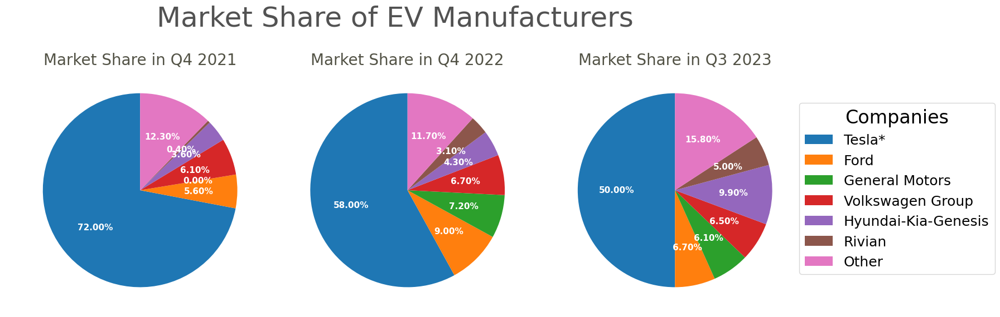

In [63]:
# Plot the pie charts
pies, axes = plt.subplots(1, 3, figsize=(18,6))

## Separating each data for the pie charts
for number, date in enumerate(end_of_year_share_df_total.index):
    label = end_of_year_share_df_total.columns[:]
    data = end_of_year_share_df_total.iloc[number,:]
    ax = axes[number]
### Pie Chart itself
    w, texts, autotexts = ax.pie(data, labels=label, autopct='%1.2f%%', startangle=90, wedgeprops=dict({'width' : 1,'linewidth': 1}), textprops={'color': 'white', 'weight': 'bold'}, radius = 1)

    # Percentages on the pie chart
    for t, at in zip(texts, autotexts):
        t.set(size=20)
        at.set(size=11)
## Subtitles
    ax.set_title(f'Market Share in {date}', fontsize=20, color = '#525245')

legend_labels = end_of_year_share_df_total.columns
## Legend
pies.legend(w, legend_labels, title="Companies", loc="center", bbox_to_anchor=(1, 0.5), fontsize = 18 ,title_fontsize = 24)
# Space between charts
pies.subplots_adjust(wspace=.1)
# Main Title
title = pies.suptitle('Market Share of EV Manufacturers', y=1.05, fontsize=36, color = '#525252')
plt.show()


Looking at the pie-charts side-to-side, it is visible how the Tesla gradually lost its market share to the competitors in the industry. This change is a directly result of the increasing competition from the local manufacturers, like General Motors, as well as international carmakers - Volkswagen Group, Hyundai-Kia-Genesis. In January and February of 2022 **Autonews**, prominent news platform for car enthusiasts, reflected that Tesla's models are the top 3 most popular EVs in the US. Nevertheless, in later periods, Tesla Model S, one of the best-selling Teslas in the past, *failed to make the top 10 in their list* (Kalmowitz, 2023).

On the other hand, the competitors are launching new and innovative EVs regularly, saturating the market and attracting more customers. In the case of the top manufacturers, Tesla's competitors are able to attract customers with significantly lower prices in the market (except for Rivian, which is also a high-end car product), and differentiality. Well-established carmakers are also able to attract existing customers to their electric vehicles by producing the EV versions of their original models. A great example is the **Ford Mustang Mach-E**.

# **Forecasting the Future Sales**

 ### Forecasting

 As a part of the analysis to address the 2nd Question, we will forecast the sales until the end of 2024 of the top 5 most populated carmakers in the original data for the State of Washington. This will help us to predict the future of the EV industry and the change in the population of EV brands in the country.

To start the analysis, as the moving average functions and methods work with the time series data, we will convert the dates in the form of **'Q1 2021'** to **PeriodIndex data with quarterly frequency**.

In [64]:
top5_sales1.reset_index(inplace = True)
top5_sales1

Automaker,index,Tesla,Ford,General Motors,Nissan,BMW
0,Q1 2021,69300,6614,9025,2925,340
1,Q2 2021,76230,6361,11263,4804,511
2,Q3 2021,75509,5880,4515,2345,426
3,Q4 2021,115248,8285,26,4165,199
4,Q1 2022,129743,6734,457,4371,1171
5,Q2 2022,130047,15273,7217,3251,1082
6,Q3 2022,114000,18257,15156,1276,4337
7,Q4 2022,131574,20339,16150,3308,7099
8,Q1 2023,161630,10866,20670,5214,6585
9,Q2 2023,175262,14843,15652,4215,11990


In [65]:
### Changing the string for the Quarter values to easily convert them into Period type
top5_sales2 = pd.DataFrame([quarter.split() for quarter in top5_sales1['index']], columns=['Quarter', 'Year'])
## Changing the date in the original df
top5_sales1['index'] = top5_sales2['Year'] + top5_sales2['Quarter']

## Renaming the column for the easier interpretation
top5_sales1 = top5_sales1.rename(columns = {'index':'Date'})

## Changing the date strings to period time objects
top5_sales1['Date'] = pd.PeriodIndex(top5_sales1['Date'], freq='Q')

In [66]:
## Setting the dates as an index
top5_sales1.set_index('Date', inplace = True, drop = True)
top5_sales1

Automaker,Tesla,Ford,General Motors,Nissan,BMW
Date,,,,,
2021Q1,69300,6614,9025,2925,340
2021Q2,76230,6361,11263,4804,511
2021Q3,75509,5880,4515,2345,426
2021Q4,115248,8285,26,4165,199
2022Q1,129743,6734,457,4371,1171
2022Q2,130047,15273,7217,3251,1082
2022Q3,114000,18257,15156,1276,4337
2022Q4,131574,20339,16150,3308,7099
2023Q1,161630,10866,20670,5214,6585


In [67]:
### Creating a copy of the original dataframe
top5_sales1_ravg = top5_sales1.copy()
### Creating new empty rows for the next 5 quarters
starting_index = top5_sales1_ravg.index[-1]
## Creating PeriodIndex data for the next 5 quarters
next_5 = pd.period_range(start= starting_index+ 1, periods=5, freq='Q')
## Creating a dataset with PeriodIndexes for the next 5 quarters
next_5_df = pd.DataFrame(index=next_5)
### concatenating the original dataframe with 5 empty columns for the next 5 quarters
top5_sales1_ravg = pd.concat([top5_sales1_ravg,next_5_df])

Now that we have the required columns, we will calculate the forecasted data for the next 5 quarters using moving average. In order to do that we will use the *rolling* function from the pandas library.

In [68]:
## Ensuring the future values are calculated by using min_periods parameter
top5_sales1_ravg = top5_sales1_ravg.rolling(window = 6, min_periods = 1).mean() ## window size is 6 to make sure the
                                                            ## next 5 averages are calculated

In [69]:
## Extracting the values for only the forecasted periods
top5_sales1_ravg_forecasted = top5_sales1_ravg.tail()
## Concatenating the forecasted data with the original dataframe
top5_sales1_with_forecast = pd.concat([top5_sales1, top5_sales1_ravg_forecasted])
## Turning all the values into integers
top5_sales1_with_forecast = top5_sales1_with_forecast.astype(int)
## Assigning a name to the index
top5_sales1_with_forecast = top5_sales1_with_forecast.rename_axis('Period')
top5_sales1_with_forecast.tail()

,Tesla,Ford,General Motors,Nissan,BMW
Period,,,,,
2023Q4,147817,17053,17537,4017,8721
2024Q1,156271,16752,18132,4702,9817
2024Q2,164504,15557,18793,5167,10723
2024Q3,165941,17902,17854,5144,12792
2024Q4,156621,20962,20057,6074,13594


At this stage of the analysis, the sales data will be plotted to determine the predicted changes in the sales using the moving average.  

In [70]:
## Converting to string as the go.Scatter doesn't intake PeriodIndex
top5_sales1_with_forecast.index = top5_sales1_with_forecast.index.astype(str)

In [71]:
## Creating an interactive plot
forecast_plot = go.Figure()

## Establishing the data for the plot
for column in top5_sales1_with_forecast.columns:
    forecast_plot.add_trace(go.Scatter(x=top5_sales1_with_forecast.index.to_numpy(),
                                y=top5_sales1_with_forecast[column], mode='lines+markers', name=column, connectgaps=True))


## Establishing the layout of the plot
forecast_plot.update_layout(
    title='Forecasted Sales of the Top 5 Brands for the Next 5 Quarters',
    xaxis_title='Period',
    yaxis_title='Number of Sales',
    legend_title='Automaker',
    showlegend=True,
    height=600,
    )


### Adding the line over the '2023Q3' to show where the forecasted data starts
forecast_plot.add_shape(
    dict(
        type="line",
        x0='2023Q3',  # start
        x1='2023Q3',  # end on x-coordinate
        y0=0,  # start
        y1=200_000,  # end on y-coordinate
        line=dict(color="green", width=2, dash="dash"),
    )
)

### Showing that the line represents the start of forecast
forecast_plot.add_annotation(
    dict(
        ## coordinates for the arrow that will show the line
        x='2023Q3',
        y=100_000,
        xref='x',
        yref='y',
        text='Start of Forecast',
        showarrow=True,
        arrowhead=3,
        ax= 150,
        ay=-65,
        font=dict(color='grey', size=14, family='Arial'),
    )
)

# Get the HTML representation of the plot
html_plot_file = "interactive_plot.html"
forecast_plot.write_html("interactive_plot.html")

Lastly, we will also make sure that the interactive plot is saved as an HTML file.

In [72]:
# Displaying the plot compatible with Jupyter HTML download
IFrame(html_plot_file, width=1000, height=800)
forecast_plot

Our forecasts show that for the last quarter of the current fiscal year, the sales for Tesla will further drop. This drop can be justified by the idea that the **price wars** with the competitors will continue to reduce the Tesla sales. However, Tesla sales are predicted to experience a steady rise as the **Cybertruck** will be rolled out throughout the next year. We believe that with the added features and its difference from the original Tesla cars, Cybertruck will help Tesla increase its sales in the rise of competition. Moreover, we would offer the company to reduce the prices of the original models as much as possible to increase the potential target market of the products.

When it comes to the other top competitors, the forecast shows that they will continue to experience a steady rise in the number of cars sold, gaining more market share from Tesla. To contribute to the rise of the periods, it is expected that the competitors will increase their presence through **marketing campaigns**. This will increase the awareness of the population regarding the presence of these automakers in the EV industry. Coupled with **competitive pricing strategies**, Ford, GM, Nissan, and BMW can pose a great threat to Tesla in the US market.

Nevertheless, throughout 2024, we expect to see the Tesla remain as the face of the EV industry by maintaining the biggest market share.

*It is worth noting that the forecasted data excludes the seasonality of the sales and the potential events, internal or external for the companies, that may significantly affect the forecasted data. The example may include the halt of production in the factories due to the unforeseen reasons.*

# **Analyzing the correlation between CO2 emmisions and the number of EV vehicles**

Brief History

In 1672, the first automobile was built by Ferdinand Verbist, a Chinese Jesuit priest, explorer, translator and inventor. This locomotive came from steam and was powerful enough to carry people and goods.

Later, in the early 18th century, Enyos Jedlik invented the first electric motor, which he later used as a small automobile design. Although it was a very early technological development over time, in 1888, the German engineer Flocken Electrowagen developed the ‘Andreas Flock’ which was the first truly electric car

In the late 19th to early 20th century, gasoline cars became more popular than EVs due to their longer range, faster refueling and more capacity according to Ford Motors

By the middle of the 20th century, the gasoline car was firmly established and became the dominant form of transportation. Gasoline cars were becoming more advanced and cost-effective and so were gasoline prices. Electric vehicles grew in popularity in the late 20th and early 21st centuries due to concerns about environmental issues including air pollution and energy security

Initially, only a few automakers introduced electric motors. However, in the second decade of the 21st century, the popularity of electric cars began to skyrocket, thanks to the introduction of more affordable cars, advances in battery technology and materials due to a greater awareness of environmental issues

Companies like Tesla played a key role in popularizing high-performance and long-range electric cars. There has been a phenomenal growth in the use of electric vehicles by 2020, and many leading automakers have invested heavily in the development and manufacture of electric vehicles

To show Electric Vehicle Sales frequency distribution histogram year wise
Source https://www.bts.gov/content/gasoline-hybrid-and-electric-vehicle-sales
Read the sheet 1-19, 3 rows 3, 4, 5 and column B to W

In [73]:
# The code snippet reads specific data from an Excel file

file_path = 'table_04_44_092523.xlsx'  # File path to the Excel file
sheet_name = '4-44'  # Name of the sheet containing the data

# Reading data from Excel, skipping the first row, and selecting specific columns for the DataFrame
ghge_df = pd.read_excel(file_path, sheet_name=sheet_name, header=0, skiprows=[0], nrows=6, usecols="B:AG")

# Transposing the DataFrame for better orientation, making 'Year' the index
ghge_df = ghge_df.T
ghge_df = ghge_df.rename_axis('Year')

# Renaming columns for clarity and better interpretation
ghge_df = ghge_df.rename(columns={0: 'Total transportation emissions', 1: 'Light-duty vehicles',
                                  2: 'CO2 (carbon dioxide)', 3: 'CH4 (methane)', 4: 'N2O (nitrous oxide)',
                                  5: 'HFCs (hydrofluorocarbons)'})

# Displaying the first 5 rows of the modified DataFrame
ghge_df.head()

,Total transportation emissions,Light-duty vehicles,CO2 (carbon dioxide),CH4 (methane),N2O (nitrous oxide),HFCs (hydrofluorocarbons)
Year,,,,,,
1990,1524.6,648.4,622.2,3.8,22.5,0.0
1991,1477.9,623.7,597.4,3.5,22.8,0.0
1992,1536.8,628.5,600.5,3.4,23.5,1.1
1993,1573.4,623.8,593.4,3.3,23.8,3.3
1994,1627.8,619.2,585.2,3.2,24.0,6.8


In [74]:
ghge_df = ghge_df[['CO2 (carbon dioxide)']]

In [75]:

# Define the file path and sheet name
file_path = 'table_01_19_062822.xlsx'
sheet_name = '1-19'

# Read the Excel file into a DataFrame, skipping the first row and selecting specific columns
ev_frequency_distribution_df = pd.read_excel(file_path, sheet_name=sheet_name, header=0, skiprows=[0], nrows=3, usecols="B:W")

# Replace 'Z' with 0 in the DataFrame
ev_frequency_distribution_df.replace('Z', 0, inplace=True)

# Transpose the DataFrame to swap rows and columns
ev_frequency_distribution_df = ev_frequency_distribution_df.T

# Rename the index to 'Year' for better clarity
ev_frequency_distribution_df = ev_frequency_distribution_df.rename_axis('Year')

# Rename the columns for better readability
ev_frequency_distribution_df = ev_frequency_distribution_df.rename(columns={0:'Hybrid electric', 1:'Plug-in hybrid-electric', 2:'Electric'})

# Calculate row sums and add a new column 'Row_Sum'
ev_frequency_distribution_df['Row_Sum'] = ev_frequency_distribution_df.sum(axis=1)

# Display the resulting DataFrame
ev_frequency_distribution_df


,Hybrid electric,Plug-in hybrid-electric,Electric,Row_Sum
Year,,,,
2000,9350,0,0,9350
2001,20282,0,0,20282
2002,36042,0,0,36042
2003,47566,0,0,47566
2004,84233,0,0,84233
2005,205876,0,0,205876
2006,251864,0,0,251864
2007,351071,0,0,351071
2008,315763,0,0,315763


Electric Passenger Cars Sales trend in USA
From this analysis, the Electric cars sales in USA over the period of time is popular, this confirms US Government is taking measures to educate and empower the electric vehicles sales and awareness over GHG emisions. Encourage through various schemes and discounts.

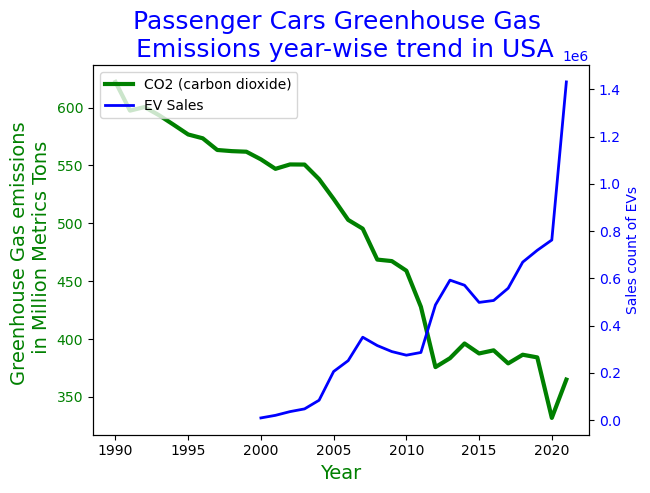

In [76]:

# Plotting Greenhouse Gas Emissions
fig, ax1 = plt.subplots()
ax1.set_xlabel("Year", fontsize=14, color='green')
ax1.set_ylabel("Greenhouse Gas emissions \n in Million Metrics Tons", fontsize=14, color='green')
ax1.set_title("Passenger Cars Greenhouse Gas \n Emissions year-wise trend in USA", fontsize=18, color='blue')

line1 = ax1.plot(ghge_df.index, ghge_df['CO2 (carbon dioxide)'], color='green', linewidth=3, label='CO2 (carbon dioxide)')
ax1.tick_params(axis='y', labelcolor='green')

# Creating a second y-axis for the EV Sales
ax2 = ax1.twinx()
line2 = ax2.plot(ev_frequency_distribution_df.index, ev_frequency_distribution_df['Row_Sum'], color='blue', linestyle='-', linewidth=2, label='EV Sales')
ax2.set_ylabel('Sales count of EVs', color='blue')
ax2.tick_params(axis='y', labelcolor='blue')

# Combining legends from both axes
lines = line1 + line2
labels = [l.get_label() for l in lines]
ax1.legend(lines, labels, loc='upper left')

plt.show()

Since the year 2000, when sales of electric cars began to rise, CO2 emissions have drastically dropped. Data available indicates a considerable drop in carbon dioxide (CO2) emissions between 2010 and 2011. This increase is indicative of environmental sustainability and remarkable This decrease shows that there can be a shift across industries and sectors towards cleaner and more sustainable practices. The primary driver of this decline is the phenomenal increase in electric vehicle (EV) adoption, a trend clearly shown in the accompanying line plot

The rise in the use of electric vehicles coincides with global initiatives aimed at reducing the negative environmental impact of conventional combustion vehicles brings in closer alignment Since electric vehicles are known for their lower carbon footprint than conventional counterparts they play an important role in curbing greenhouse gas emissions. The information in the line plot highlights the broader issue of environmental awareness, technological advances in EVs, and government-supported policies enforcing the transition to cleaner transportation emphasize encouragement



#**Conclusion**

**The rise of Electric Vehicles is eminent**. Many traditional manufacturers, like Toyota, that are still not fully invested in the EV market, believe that the increasing demand for the raw products needed for developing the EVs will potentially reduce the output of the automakers’ production lines. (Wayland, 2022).  Nevertheless, even though the material costs for producing EVs rose significantly (nearly doubled) during the pandemic, since 2021, the automakers are regularly increasing their EV sales (Kachwala, 2023). *The direct correlation between the population of EVs and the number of charging stations, as well as the number of laws and incentives in different states, reflect that the fall of the EV industry is nowhere near*. Tesla, which has been dominating the market for some time now, is experiencing a fall in its market share as more EV automakers emerge and traditional manufacturers heavily focus on the emerging industry. This transition can be justified by the rise of laws and incentives for the EV industry, encouraging consumers and producers to focus on this segment of the car market. However, the inconsistency in the number of the present laws and regulations in various states depicts that the local governments still have a long way to go. As we showed in our analysis, the rise of EVs is poised to play a crucial role in environmental conservation by significantly reducing the emission of harmful gases, such as CO2. *To ensure the sustainable future of the country* it would be beneficial for the state governments to not only further encourage the transition to EVs, but also to actively support EV manufacturers as they may potentially face the aforementioned issue related to the supply of the raw materials.

# **References**

## Datasets

1. [Washington Dataset](https://catalog.data.gov/dataset/electric-vehicle-population-data)

2. [Electric Vehicle Charging Stations in the US](https://www.kaggle.com/datasets/jameslemieux2/ev-chargers/data)

3. [Laws and Incentives Dataset](https://afdc.energy.gov/laws/9232)

4. [Electric Vehicle Sales frequency distribution histogram year wise](https://www.bts.gov/content/gasoline-hybrid-and-electric-vehicle-sales)

5. [CO2 Emissions by Passenger Cars](https://www.bts.dot.gov/browse-statistical-products-and-data/national-transportation-statistics/transportation-related)


## Other Used links and articles



1. [Kachwala, Z. (2023, October 12). US electric-vehicle sales hit record high, Tesla loses market share, report says. Reuters](https://www.reuters.com/business/autos-transportation/us-electric-vehicle-sales-hit-record-high-tesla-loses-market-share-report-2023-10-12/)

2. [Murphy, A. (2023, December 1). Cybertruck’s price tag draws mixed reviews. Fox Business.](https://www.foxbusiness.com/markets/cybertrucks-price-tag-draws-mixed-reviews)

3. [Fischer, J. (2023, December 1). Electric vehicle sales and market share (US - updated monthly). CarEdge.](https://caredge.com/guides/electric-vehicle-market-share-and-sales)

4. [Kalmowitz, A. (2023, April 12). Tesla’s EV market share is dropping fast. Jalopnik: Obsessed with the Culture of Cars.](https://jalopnik.com/tesla-us-ev-market-share-is-dropping-fast-1850327204)

5. [Worth the Watt: A Brief History of the Electric Car, 1830 to Present](https://www.caranddriver.com/features/g43480930/history-of-electric-cars/)

6. [Clean Technica](https://cleantechnica.com/2023/09/22/electric-vehicle-sales-in-us-hit-the-accelerator-pedal/#:~:text=The%20higher%20EV%20sales%20volume,in%20states%20across%20the%20country
)

7. [New York Times](https://www.nytimes.com/2023/03/05/nyregion/electric-vehicles-cars-nyc.html)

8. [Understanding acronyms for Laws and Incentives categories](https://afdc.energy.gov/data_download/laws_and_incentives_format)

9. [Wayland, M. (2022, September 14). Why Toyota – the world’s largest automaker – isn’t all-in on Electric Vehicles. CNBC.](https://www.cnbc.com/2022/09/13/why-toyota-the-worlds-largest-automaker-isnt-all-in-on-evs.html)